# EE460J Lab 2
Jianchen Gu - jg68927  
Anuv Gupta - ag68799    
Pulkit Mahajan - pm28838
### Programming Questions

In [1]:
import math
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import scipy

**1.** Correlations  
>- When given a data matrix, an easy way to tell if any two columns are correlated is to look at a scatter plot of each column against each other column. For a warm up, do this: Look at the data in DF1 in Lab2 Data.zip. Which columns are (pairwise) correlated? Figure out how to do this with Pandas, and also how to do this with Seaborn.  
>- Compute the covariance matrix of the data. Write the explicit expression for what this is, and then use any command you like (e.g., np.cov) to compute the 4 × 4 matrix. Explain why the numbers that you get fit with the plots you got.  
>- The above problem in reverse. Generate a zero-mean multivariate Gaussian random variable in 3 dimensions, Z = (X1, X2, X3) so that (X1, X2) and (X1, X3) are uncorre- lated, but (X2, X3) are correlated. Specifically: choose a covariance matrix that has the above correlations structure, and write this down. Then find a way to generate samples from this Gaussian. Choose one of the non-zero covariance terms (Cij, if C denotes your covariance matrix) and plot it vs the estimated covariance term, as the number of samples you use scales. The goal is to get a visual representation of how the empirical covariance converges to the true (or family) covariance.

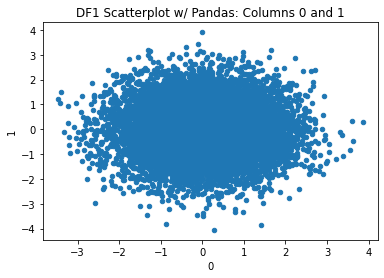

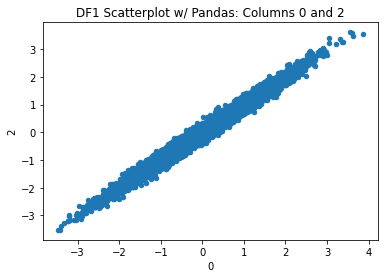

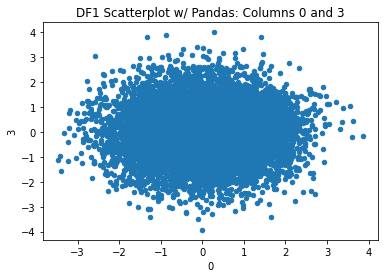

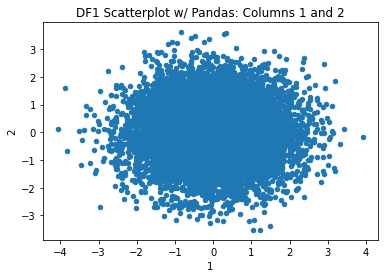

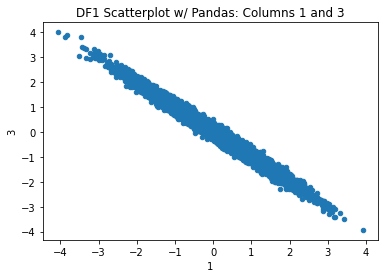

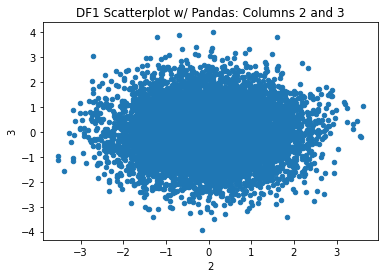

In [2]:
# fetch DF1 CSV file
df_1 = pd.read_csv("DF1", header=0).iloc[:, 1:]

# plot with Pandas
for i in range(4):
    for j in range(i+1,4):
        df_1.plot.scatter(x=str(i), y=str(j), title=f'DF1 Scatterplot w/ Pandas: Columns {i} and {j}')

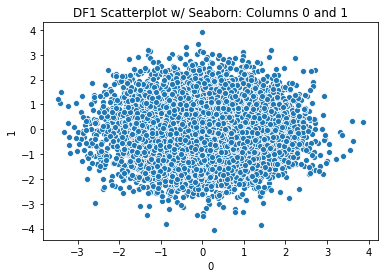

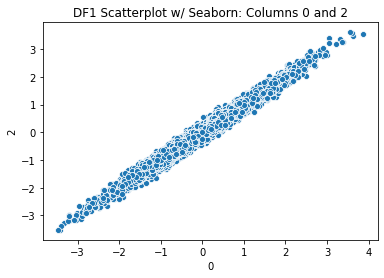

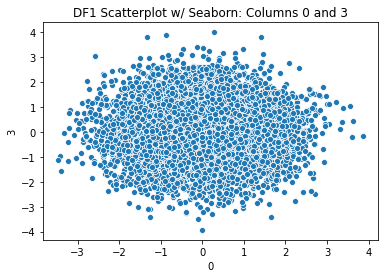

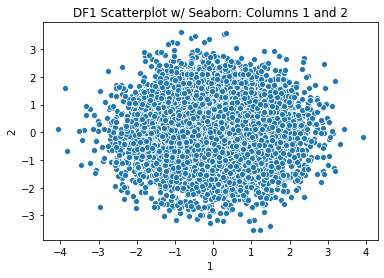

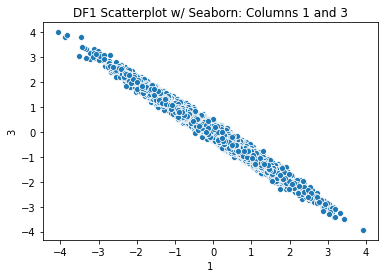

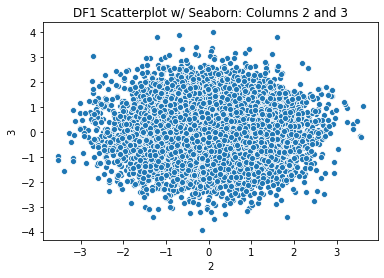

In [3]:
# plot with Seaborn
for i in range(4):
    for j in range(i+1,4):
        plt.figure()
        sns.scatterplot(data=df_1, x=str(i), y=str(j)).set_title(f'DF1 Scatterplot w/ Seaborn: Columns {i} and {j}')

>In this dataset, Columns 0 and 2 are correlated, as well as Columns 1 and 3.

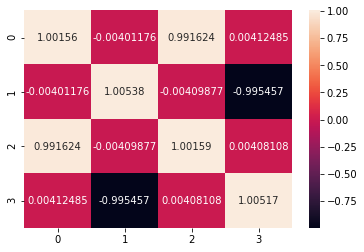

In [4]:
# use Pandas covariance matrix function
cov_df_1 = pd.DataFrame.cov(df_1)
sns.heatmap(cov_df_1, annot=True, fmt='g')
plt.show()

>The explicit expression is:      
[ var(0) &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;cov(0,1)&nbsp;&nbsp;cov(0,2)&nbsp;&nbsp;cov(0,3) ]  
[ cov(1,0)&nbsp;&nbsp;var(1) &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;cov(1,2)&nbsp;&nbsp;cov(1,3) ]  
[ cov(2,0)&nbsp;&nbsp;cov(2,1)&nbsp;&nbsp;var(2) &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;cov(2,3) ]  
[ cov(3,0)&nbsp;&nbsp;cov(3,1)&nbsp;&nbsp;cov(3,2)&nbsp;&nbsp;var(3) &nbsp;&nbsp;&nbsp;&nbsp;]   



>From the covariance matrix, we can see that the covariance between Columns 0 and 2 is 0.991624 (cells [0,2] and [2,0] above), which is a large positive covariance in our matrix. This reflects the scatterplot between Columns 0 and 2, which show them as positively correlated data.  
The same applies for Columns 1 and 3, which have a large negative covariance of -0.995457 (cells [1,3] and [3,1]), and are shown as negatively correlated in their scatterplot.

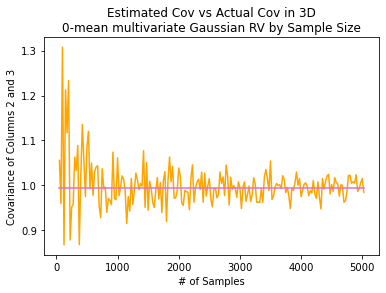

In [5]:
# definitions for our 3D zero-mean multivariate Gaussian RV
cov_Z = [[1.000, 0.005, -0.005],
        [0.005, 1.000, 0.995],
        [-0.005, 0.995, 1.000]]
mean_Z = [0, 0, 0]

# lists to use for plotting
cov_results = []
samples_list = []

# get covariance of columns 2 and 3 in the 3D RV every 25 samples
samples = 25
while samples <= 5000:
    # generate multivariate Gaussian RV 
    samples_Z = np.random.multivariate_normal(mean_Z, cov_Z, samples)
    df_Z = pd.DataFrame(data=samples_Z)
    cov_Z_estimated = pd.DataFrame.cov(df_Z)
    # add covariance results + sample size
    cov_results.append(cov_Z_estimated[1][2])
    samples += 25
    samples_list.append(samples)

# generate line plots to compare how estimated covariance compares to actual covariance
# as number of samples scales
plt.title('Estimated Cov vs Actual Cov in 3D\n'
           '0-mean multivariate Gaussian RV by Sample Size')
plt.xlabel('# of Samples')
plt.ylabel('Covariance of Columns 2 and 3')
plt.plot(samples_list, cov_results, 'orange', 
         samples_list, [0.995 for i in samples_list], 'orchid')
plt.show()

**2.** Outliers. 
>Consider the two-dimensional data in DF2 in Lab2 Data.zip. Look at a scatter plot of the data. It contains two points that look like potential outliers. Which one is “more” outlying? Propose a transformation of the data that makes it clear that the point at (−1, 1) is more outlying than the point at (5.5,5), even though the latter point is“farther away” from the nearest points. Plot the data again after performing this transformation. Provide discussion as appropriate to justify your choice of transformation.  
*Hint: if y comes from a standard Gaussian in 2D (i.e., with covariance equal to the two by two identity matrix), and*  

>Q = [2 &nbsp;&nbsp; 0.5]  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[0.5 &nbsp;&nbsp; 2]

>*what is the covariance matrix of the random variable z = Qy? If you are given z, how would you create a random Gaussian vector with covariance equal to the identity, using z?*

0         1
0     1.038502  0.835053
1     0.320455  0.149079
2     0.055480  0.271672
3    -0.007260 -0.126550
4    -1.237390 -1.049932
...        ...       ...
9995 -0.632309 -0.797517
9996  0.679417  0.526470
9997  0.890697  1.072751
9998  0.475293  0.536909
9999  1.207406  1.230797

[10000 rows x 2 columns]


<AxesSubplot:title={'center':'DF2 Scatterplot'}, xlabel='0', ylabel='1'>

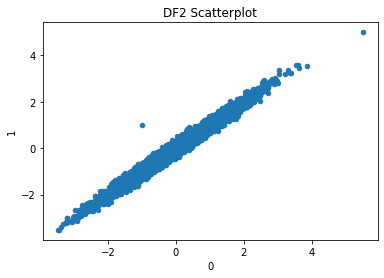

In [6]:
# fetch DF2 CSV file
df_2 = pd.read_csv("DF2", header=0).iloc[:, 1:]
print(df_2)

# plot with Pandas
df_2.plot.scatter(x='0', y='1', title=f'DF2 Scatterplot')

Transformed [-1,1] coordinates:
 [[-1.22780900e-04]
 [ 1.40294582e+01]]

Transformed [5.5,5] coordinates:
 [[ 5.25180851]
 [-3.49832423]]


<AxesSubplot:title={'center':'DF2 Scatterplot'}, xlabel='0', ylabel='1'>

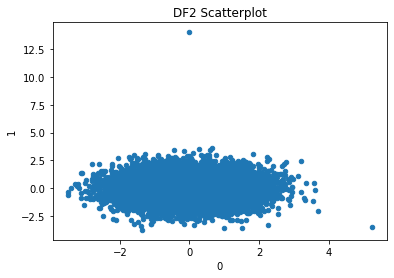

In [7]:
# use Pandas covariance matrix function
cov_df_2 = pd.DataFrame.cov(df_2)

# Calculate eigenvalues and eigenvectors of DF2 covariance matrix
A = np.array(cov_df_2)
eigenvalues, eigenvectors = np.linalg.eig(A)

# Eigendecomposition
# Covariance matrix = P * D * P^(-1)
P = eigenvectors
D = np.array([[eigenvalues[0], 0],[0, eigenvalues[1]]])

# calculate Q matrix 
Q = P @ np.sqrt(D)

# store transformed data to create dataframe later
transformed_data = {}

for index, row in df_2.iterrows():
    transformed_data[str(index)] = np.linalg.inv(Q) @ np.array(row)

df_2_transformed = pd.DataFrame(transformed_data).T

print(f'Transformed [-1,1] coordinates:\n {np.linalg.inv(Q) @ np.array([[-1], [1]])}\n')
print(f'Transformed [5.5,5] coordinates:\n {np.linalg.inv(Q) @ np.array([[5.5], [5]])}')

# plot with Pandas
df_2_transformed.plot.scatter(x=0, y=1, title='DF2 Scatterplot')

Here, we can see that point [-1, 1] transformed to coordinates [-0.00012278, 14.0294582], and it is clearly much more of outlier compared to the transformed [5.5, 5] at [5.25, -3.50]. The choice of transformation used here is using the given samples covariance and eigendecomposing it to find details for discovering the transformation matrix. The reason behind taking an approach like this is that since we are dealing with multivariate Gaussian data (we plotted them separately and found that they were normally distributed), we can plot them together into a bell curve (this current plot would be bird's eye view) that gives us a better idea of where data stands.

**3.** Even More Standard Error


> Compute this empirically, as follows: We will generate data for a regression problem, solve it,
and see what the error is: Generate data as follows: xi ∼ N(0, 1), ei ∼ N(0, 1). Generate y
by yi = β0 +xiβ +ei
, where β0 = −3 and β = 0. Note that since β = 0, this means that y and
x are unrelated! The question we are exploring here is as follows: when we solve a regression
problem, we are not going to find βˆ = 0 – we will find that βˆ takes some other values, hopefully
close to zero. How do we know if the value of βˆ we get is statistically meaningful?
 - By creating fresh data and each time computing βˆ and recording βˆ − β, compute the
empirical standard deviation of the error for n = 150. By running a linear regression
of y vs. noise, we find βˆ = −0.15. Given your empirical computation of the standard
deviation of the error, how significant is the value −0.15?

In [8]:
np.seterr(divide='ignore', invalid='ignore')
beta_0 = -3
beta = 0

def emp_std_dev(n):
    errors = []
    for i in range(n):
        xi = np.random.normal(0, 1, n)
        ei = np.random.normal(0, 1, n)
        yi = beta_0 + xi * beta + ei
        beta_hat = scipy.stats.linregress(yi, xi).slope
        errors.append(beta_hat - beta)
    return np.std(errors)
    
print("emp_std_dev(150) = {}".format(emp_std_dev(150)))

emp_std_dev(150) = 0.07455894482960534


Empirical standard deviation of ~0.08759280925519247 at 150 samples is close to 0, so we assume that the noise is responsible for the B^ value of -0.15, meaning that it is not statistically significant.

> - Now repeat the above experiment for different values of n. Plot these values, and on the
same plot, plot 1/
√n. How is the fit?

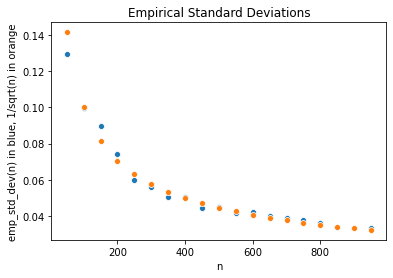

<Figure size 432x288 with 0 Axes>

In [9]:
deviations = []
n_s = np.array(range(0, 1000, 50))
n_mod = 1. / np.sqrt(n_s)
for i in n_s:
    deviations.append(emp_std_dev(i))
sns.scatterplot(x="n_s", y="deviations", data={
    "n_s": n_s, "deviations": deviations
});
sns.scatterplot(x="n_s", y="n_mod", data={
    "n_s": n_s, "n_mod": n_mod
});
plt.title("Empirical Standard Deviations");
plt.xlabel("n");
plt.ylabel("emp_std_dev(n) in blue, 1/sqrt(n) in orange");
plt.figure();

We can see that as n increases, the Empirical Standard Deviation of the linear regression approaches 0 at the same rate/shape as 1/sqrt(n), confirming our findings in the previous step.

**4.** Names and Frequencies


1. Write a program that on input k and XXXX, returns the top k names from year XXXX.  
2. Write a program that on input Name returns the frequency for men and women of the name Name.
3. It could be that names are more diverse now than they were in 1880, so that a name may be relatively the most popular, though its frequency may have been decreasing over the years. Modify the above to return the relative frequency. Note that in the next coming lectures we will learn how to quantify diversity using entropy
4. Find all the names that used to be more popular for one gender, but then became more popular for another gender
5. (Optional) Find something cool about this data set

In [10]:
#1. Write a program that on input k and XXXX, returns the top k names from year XXXX.  
def topNames(k, year):
    nameDF = pd.read_csv("Names/yob" + year + ".txt")
    cols = nameDF.columns[2]
    print(nameDF.nlargest(k, cols))


In [11]:
#show topNames works
topNames(10, "2015")
topNames(10, "1880")

Emma  F  20355
0        Olivia  F  19553
18992      Noah  M  19511
18993      Liam  M  18281
1        Sophia  F  17327
18994     Mason  M  16535
2           Ava  F  16286
18995     Jacob  M  15816
18996   William  M  15809
3      Isabella  F  15504
18997     Ethan  M  14991
        Mary  F  7065
941     John  M  9655
942  William  M  9531
943    James  M  5927
944  Charles  M  5348
945   George  M  5126
946    Frank  M  3242
947   Joseph  M  2632
0       Anna  F  2604
948   Thomas  M  2534
949    Henry  M  2444


In [12]:
#2. Write a program that on input Name returns the frequency for men and women of the name Name.
def nameFreq(name):
    mCount = 0
    fCount = 0
    for year in range(1880, 2016):
        currDF = pd.read_csv("Names/yob" + str(year) + ".txt", header=None)
        johnDF = currDF.loc[currDF[0] == name]
        femDF = johnDF.loc[johnDF[1] == 'F']
        malDF = johnDF.loc[johnDF[1] == 'M']
        fCount += femDF[2].sum()
        mCount += malDF[2].sum()
    return mCount, fCount

In [13]:
name = "John"
guys, girls = nameFreq(name)
print("Males with name " + name + ": " + str(guys) + "    Females with name " + name + ": " + str(girls))

Males with name John: 5095674    Females with name John: 21657


In [14]:
#3. It could be that names are more diverse now than they were in 1880, so that a name may be relatively the most popular, 
# though its frequency may have been decreasing over the years. Modify the above to return the relative frequency. 
def relativeFreq(name, year):
    currDF = pd.read_csv("Names/yob" + str(year) + ".txt", header=None)
    nameCount = currDF.loc[currDF[0] == name][2].sum()
    totalNamesThatYear = currDF[2].sum()
    return nameCount/totalNamesThatYear

In [15]:
name = "John"
year = 2014
relFreqPercent = math.trunc(100. * 1000. * relativeFreq(name, year)) / 1000.
print("Percentage of people in {} with name {}: {}%".format(year, name, relFreqPercent))

Percentage of people in 2014 with name John: 0.289%


In [18]:
#4. Find all the names that used to be more popular for one gender, but then became more popular for another gender.

popularity = pd.DataFrame({ "name": [] }, columns = [ "name" ])
counter = 0
for year in range(1880, 2015 + 1):
    counter += 1
    if counter % 10 == 0:
      print()
    print('{} '.format(year), end='')
    df = pd.read_csv("Names/yob" + str(year) + ".txt", header=None)
    df.columns = ["name", 'gender', 'frequency']
    df = df[df['gender'] == 'M'].merge(df[df['gender'] == 'F'], on='name', how='outer')
    df = df.fillna(value=0)
    df[str(year)] = df["frequency_x"] - df["frequency_y"]
    popularity = popularity.merge(df[['name', str(year)]], on='name', how='outer')
popularity = popularity.fillna(value=0)
print()

188018811882188318841885188618871888
1889189018911892189318941895189618971898
1899190019011902190319041905190619071908
1909191019111912191319141915191619171918
1919192019211922192319241925192619271928
1929193019311932193319341935193619371938
1939194019411942194319441945194619471948
1949195019511952195319541955195619571958
1959196019611962196319641965196619671968
1969197019711972197319741975197619771978
1979198019811982198319841985198619871988
1989199019911992199319941995199619971998
1999200020012002200320042005200620072008
2009201020112012201320142015


In [17]:
popularity["min_diff"] = popularity.min(axis=1, numeric_only=True)
popularity["max_diff"] = popularity.max(axis=1, numeric_only=True)
popularity["switched"] = np.where(((popularity["min_diff"] > 0) & (popularity["max_diff"] < 0)) | ((popularity["min_diff"] < 0) & (popularity["max_diff"] > 0)), True, False)
names = popularity[popularity["switched"] == True]['name'].to_numpy()
print("{} names".format(len(names)))
counter = 0
for n in names:
  counter += 1
  if counter % 10 == 0:
    print()
  print(n, end=' ')

a Ondra Tani 
Terrace Mikal Cortney Rooney Cheron Stanlee Dru Dondra Nickola Shayne 
Daine Darnelle Jimmi Randie Rikki Denys Ferrin Jamey Lavorn Rande 
Ricci Rondie Rowen Shan Wyn Barri Stormy Freddi Jade Jimi 
Roi Tanny Charron Danis Jonatha Renne Shanon Thoma Carlan Dannye 
Breck Colyn Delacy Dinnie Terran Terris Kristan Riki Shayron Angle 
Dari Kitt Rayne Sami Sung Dalis Galyn Ridgely Dany Ki 
Krist Storm Tary Torry Franki Jaimie An Deni Di Cheyenne 
Chrys Demetrice Doni Edy Maurya Mical Peni Bryn Tory Mauri 
Shalom Daney Dorin Tolly Donnelle Karn Kelcie Larri Shermaine Adrean 
Dayl Gal Keron Kyung Suan Terrylee Verlynn Rian Jersey Lan 
Brand Desi Guadlupe Kayle Jamelle Kriss Lawren Mardy Shawne Cher 
Danni Dore Kevyn Nikola Revon Keary Michae Dandy Johnel Demetris 
Graylin Arlanda Kippy Monti Rossi Rorie Ranell Christia Gudalupe Kimm 
Cidney Nikita Rendy Scotti Shon Skeeter Bevin Vonn Ainsley Darcel 
Koren Shann Shea Daniele Dareen Davee Geryl Kasey Kym Nanda 
Shaune Unk Choya Dani